In [2]:
import geopandas as gpd
from highcharts_maps.chart import Chart
from highcharts_maps.options.series.map import MapSeries
import folium
import matplotlib.pyplot as plt
import pandas as pd
import contextily as cx


In [3]:
df_67 = gpd.read_file("data/67/D67_RPG2022_niv1.shp", engine="pyogrio")
df_68 = gpd.read_file("data/68/D68_RPG2022_niv1.shp", engine="pyogrio")
df = gpd.GeoDataFrame(pd.concat([df_67, df_68]))

In [4]:
df

,NUM_ILOT,NUM_PARCEL,CODE_CULTU,SURF_ADM,BIO,MARAICHAGE,AGROFOREST,geometry
0,11,1,PPH,15.63,1,0,None,"POLYGON ((1004321.807 6813947.237, 1004316.122..."
1,11,1,PPH,0.97,0,0,None,"POLYGON ((1004311.338 6822217.053, 1004348.380..."
2,16,56,BTH,1.90,0,0,None,"POLYGON ((1004227.240 6869838.308, 1004225.674..."
3,36,1,PTR,1.04,1,0,None,"POLYGON ((1004290.477 6870646.137, 1004134.265..."
4,54,1,BTH,1.72,0,0,None,"POLYGON ((1004427.790 6870806.379, 1004341.201..."
...,...,...,...,...,...,...,...,...
91313,23,1,BTH,1.02,0,0,None,"POLYGON ((1041143.761 6727807.937, 1041141.977..."
91314,70,1,BTH,1.50,0,0,None,"POLYGON ((1041334.032 6727821.796, 1041303.340..."
91315,8,2,J6S,2.95,0,0,None,"POLYGON ((1041393.591 6764289.536, 1041346.244..."
91316,4,1,J5M,0.02,1,0,None,"POLYGON ((1043019.476 6733696.205, 1043012.142..."


In [5]:
ref_culture = pd.read_csv("data/REF_CULTURES_GROUPES_CULTURES_2021.csv", sep=';')
ref_culture

,CODE_CULTURE,LIBELLE_CULTURE,CODE_GROUPE_CULTURE,LIBELLE_GROUPE_CULTURE
0,BTH,Blé tendre d’hiver,1,Blé tendre
1,BTP,Blé tendre de printemps,1,Blé tendre
2,MID,Maïs doux,2,Maïs grain et ensilage
3,MIE,Maïs ensilage,2,Maïs grain et ensilage
4,MIS,Maïs,2,Maïs grain et ensilage
...,...,...,...,...
347,TRU,Truffière (chênaie de plants mycorhizés),28,Divers
348,VET,Vétiver,28,Divers
349,ZZZ,Culture inconnue,28,Divers
350,MLS,Mélange de légumineuses non fourragères prépon...,8,Protéagineux


In [6]:

df = df.set_index("CODE_CULTU").join(ref_culture.set_index("CODE_CULTURE"))

In [7]:
df["LIBELLE_GROUPE_CULTURE"].isna().sum()

0

In [8]:
df_sorted = df[["SURF_ADM", "LIBELLE_GROUPE_CULTURE"]].groupby(["LIBELLE_GROUPE_CULTURE"]).sum().sort_values("SURF_ADM", ascending=False)

df_sorted

,SURF_ADM
LIBELLE_GROUPE_CULTURE,
Maïs grain et ensilage,125105.34
Prairies permanentes,70238.46
Blé tendre,48044.67
Fourrage,7396.90
Prairies temporaires,7341.06
Colza,7333.38
Autres oléagineux,7152.48
Vignes,6206.55
Autres cultures industrielles,5844.02


<Axes: ylabel='SURF_ADM'>

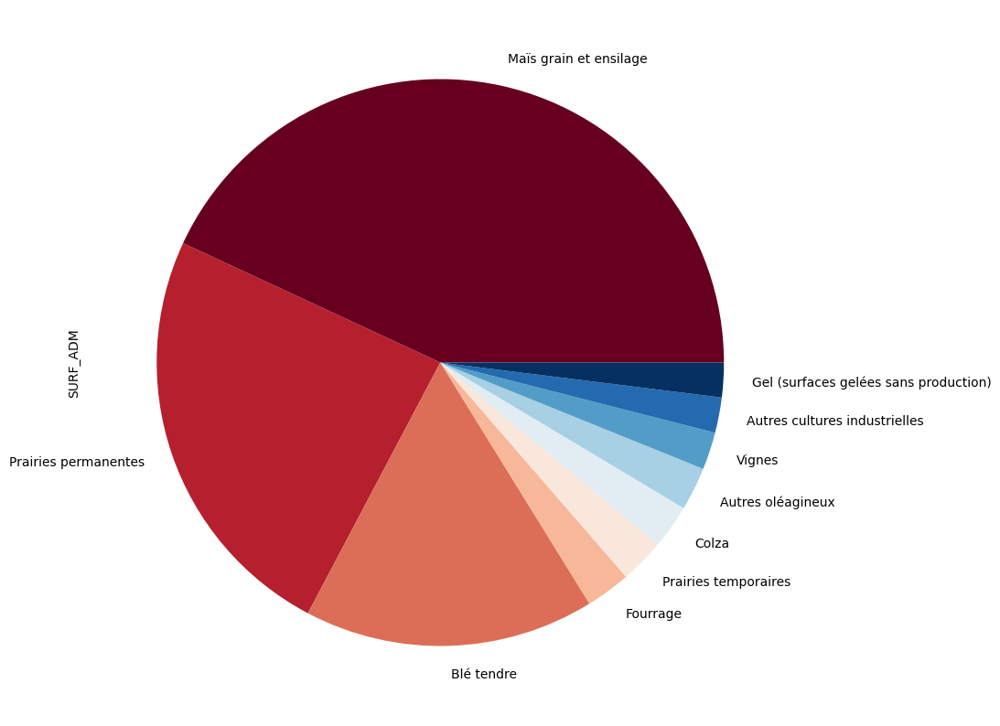

In [9]:
df_sorted.nlargest(10, "SURF_ADM").plot(figsize=(10, 20), kind="pie", x=df_sorted.index, y="SURF_ADM", legend=False, cmap='RdBu')

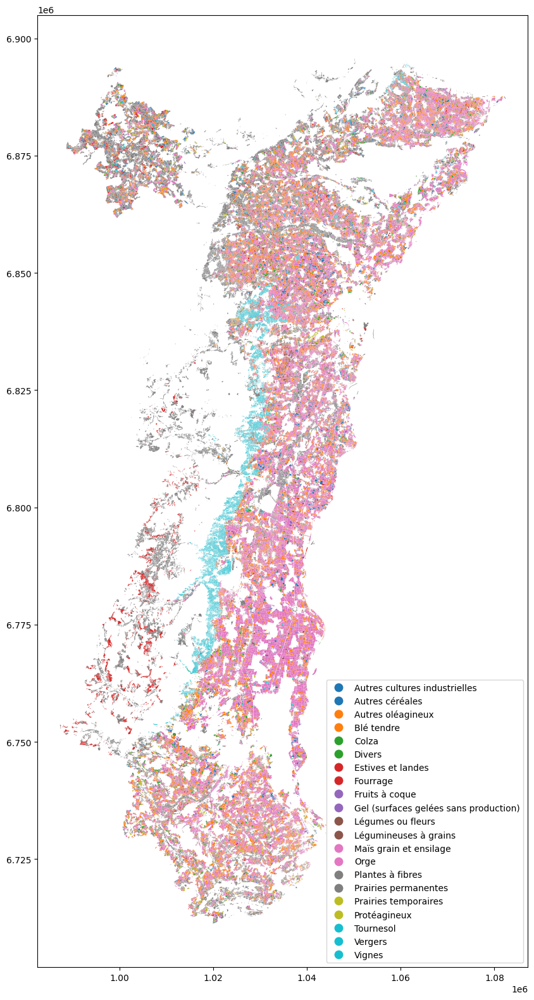

In [10]:
df.plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True,  legend_kwds={'loc': 'lower right'})
plt.show()

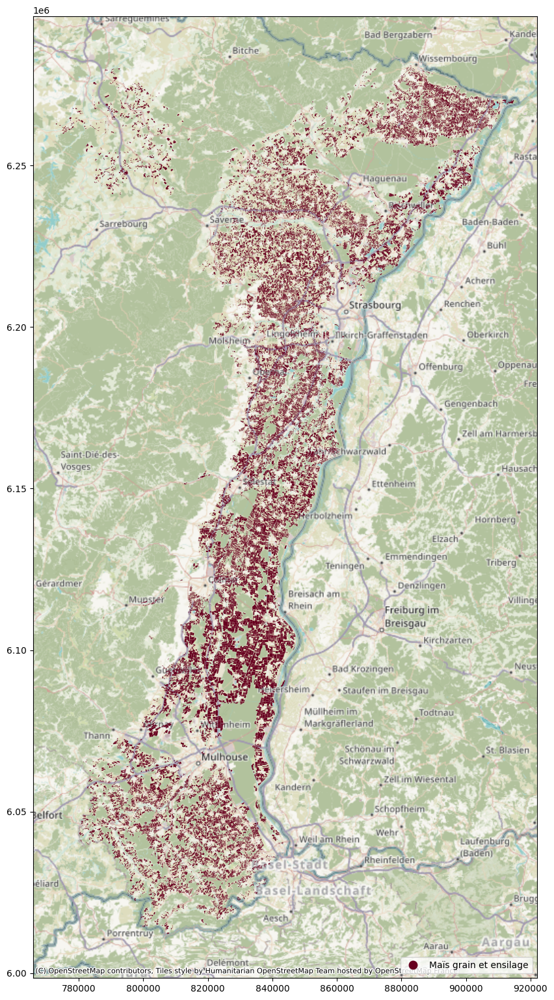

In [21]:
mais_grains_ensilage = df[df["LIBELLE_GROUPE_CULTURE"]=="Maïs grain et ensilage"]
ax = mais_grains_ensilage.to_crs(epsg=3857).plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True, cmap="RdBu" , legend_kwds={'loc': 'lower right'})
cx.add_basemap(ax)

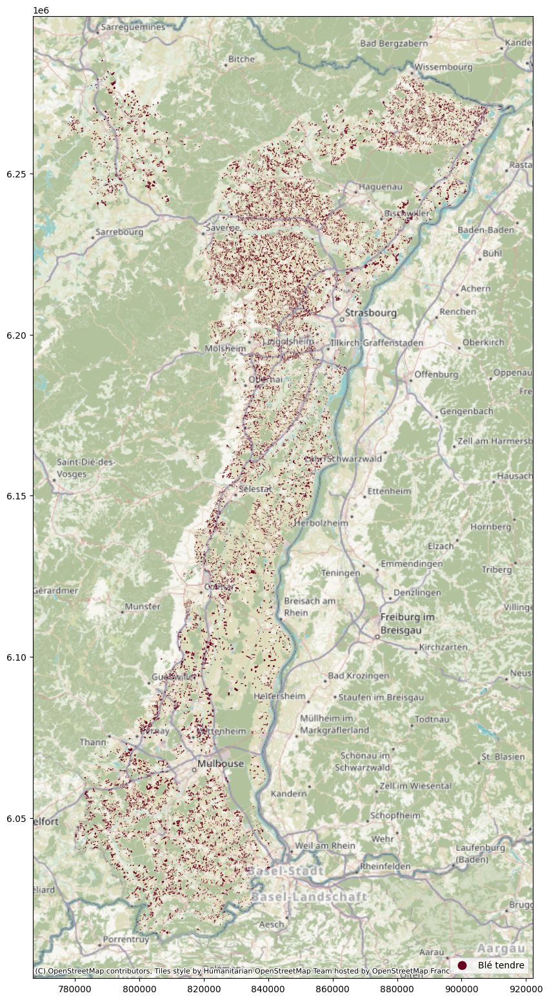

In [24]:
ble_tendre = df[df["LIBELLE_GROUPE_CULTURE"]=="Blé tendre"]
ax = ble_tendre.to_crs(epsg=3857).plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True, cmap="RdBu", legend_kwds={'loc': 'lower right'})
cx.add_basemap(ax)

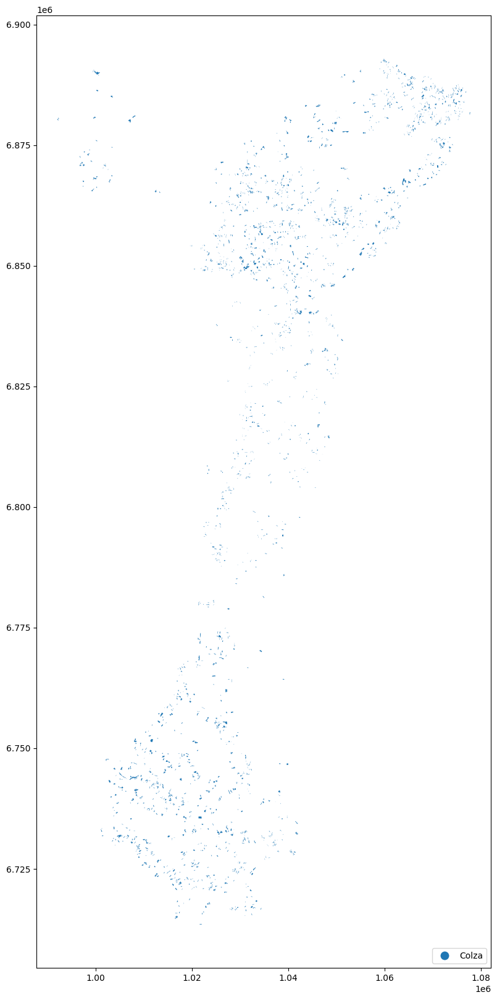

In [14]:
df[df["LIBELLE_GROUPE_CULTURE"]=="Colza"].plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True,  legend_kwds={'loc': 'lower right'})
plt.show()

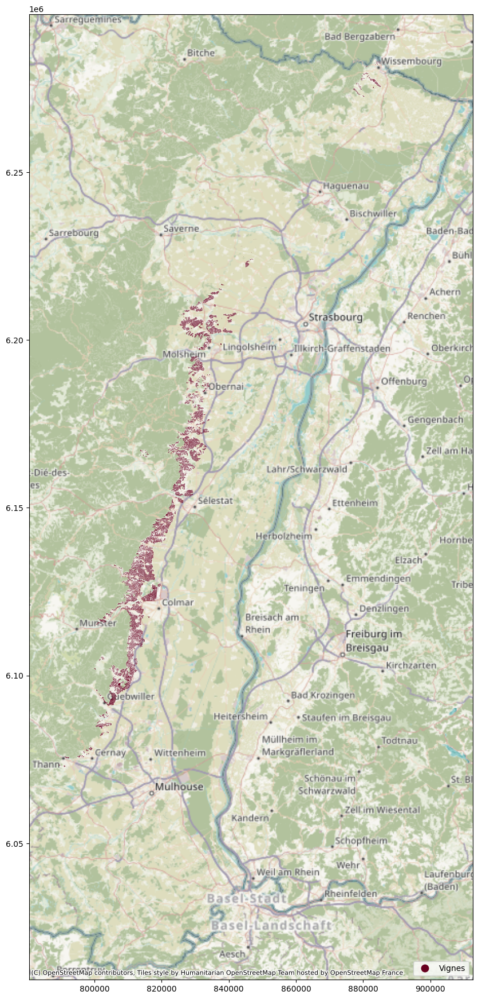

In [25]:
vignes = df[df["LIBELLE_GROUPE_CULTURE"]=="Vignes"]
ax = vignes.to_crs(epsg=3857).plot(figsize=(10, 30), column="LIBELLE_GROUPE_CULTURE", legend=True,cmap="RdBu",  legend_kwds={'loc': 'lower right'})
cx.add_basemap(ax)

In [16]:
for _, r in vignes.head(100000).to_crs(epsg=4326).iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r["geometry"]).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, style_function=lambda x: {"fillColor": "orange"})
    folium.Popup(r["LIBELLE_GROUPE_CULTURE"]).add_to(geo_j)
    geo_j.add_to(map)
map

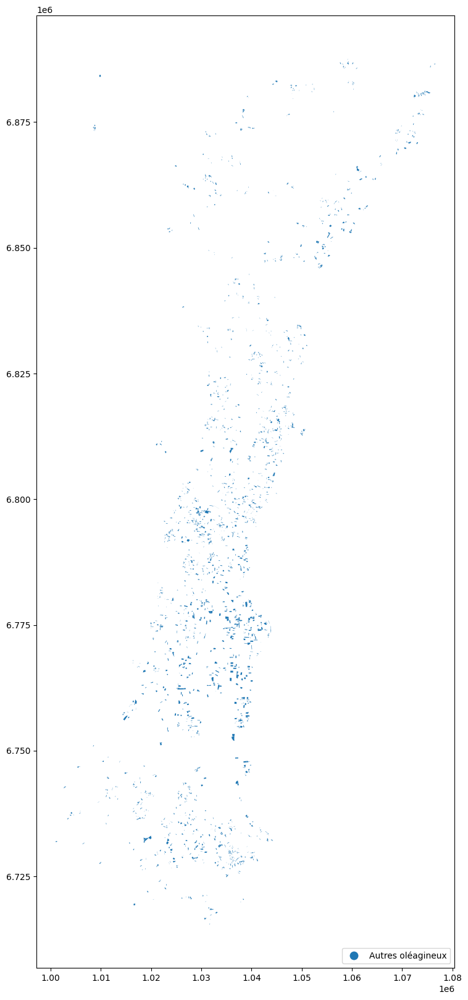

In [148]:
df[df["LIBELLE_GROUPE_CULTURE"]=="Autres oléagineux"].plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True,  legend_kwds={'loc': 'lower right'})
plt.show()
#Autres oléagineux

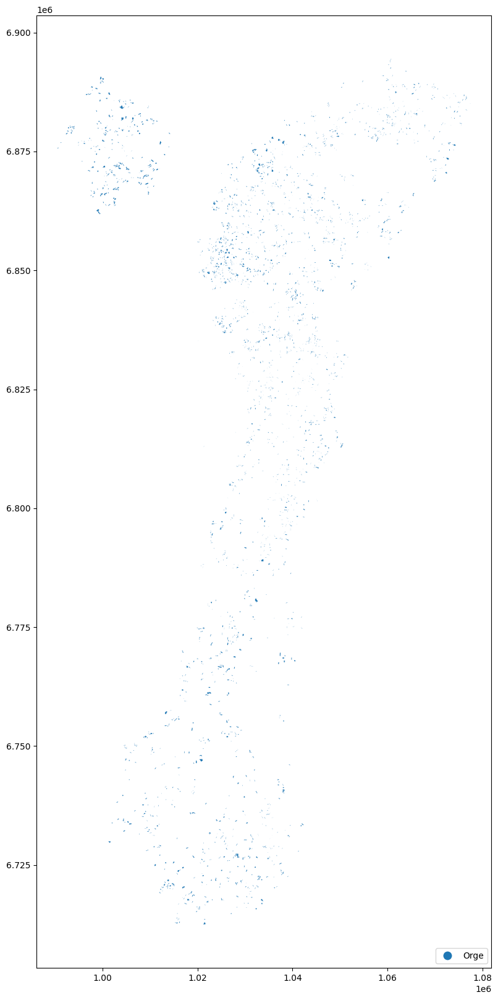

In [149]:
df[df["LIBELLE_GROUPE_CULTURE"]=="Orge"].plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True,  legend_kwds={'loc': 'lower right'})
plt.show()

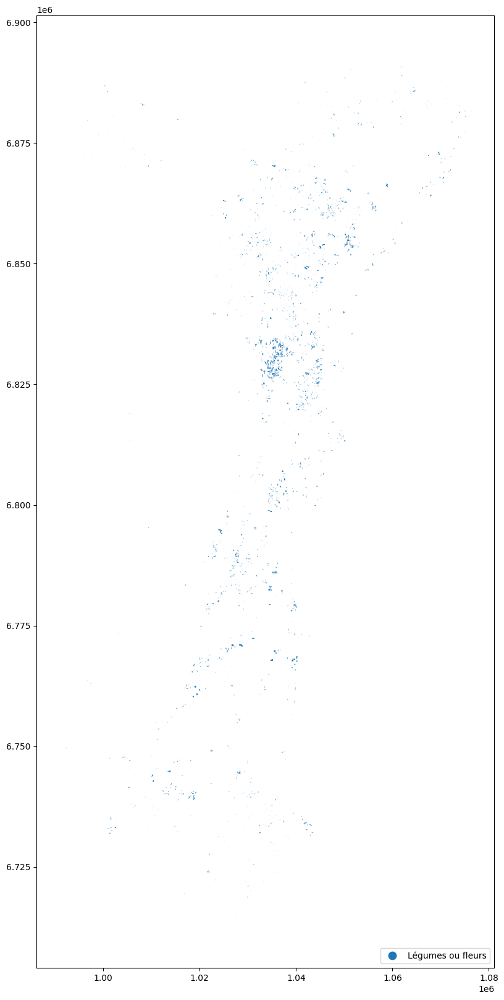

In [150]:
df[df["LIBELLE_GROUPE_CULTURE"]=="Légumes ou fleurs"].plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True,  legend_kwds={'loc': 'lower right'})
plt.show()


# Cultures étudiées

* Maïs grain et ensilage
* Blé tendre
* Colza
* Vignes
* Autres oléagineux
* Orge
* Légumes ou fleurs

